In [49]:
from PIL import Image
from PIL import ImageFilter
import matplotlib.pyplot as plt
from pathlib import Path
import sys

# These imports let you use opencv
import cv2 #opencv itself
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

# dir and my plot function
base = Path.cwd() 
data_dir = base / "data"
out_data = base / "out"
# print(data_dir)

def pilshow(image,cmap=None):
      plt.imshow(image,cmap=cmap)
      plt.axis("off")
      plt.show()

## Image Interpolation
Image interpolation is a technique used to estimate intermediate pixel values between known pixel values in digital images. This is particularly useful when resizing images, rotating them, or performing other transformations that require new pixel values to be generated.
- Nearest Neighbor Interpolation: selects the value of the nearest point and does not consider the values of neighboring points at all, yielding a piecewise-constant interpolant
- Bilinear Interpolation: uses valkues of only the 4 nearest pixels, located in diagonal directions from a given pixel
- Bicubic Interpolation: considers the closest 16 pixels (a 4x4 grid) to estimate the new pixel value, resulting in smoother images compared to bilinear interpolation.

opencv--cv2.
resize(src, dsize[, dst[, fx[, fy[, interpolation]]]])
[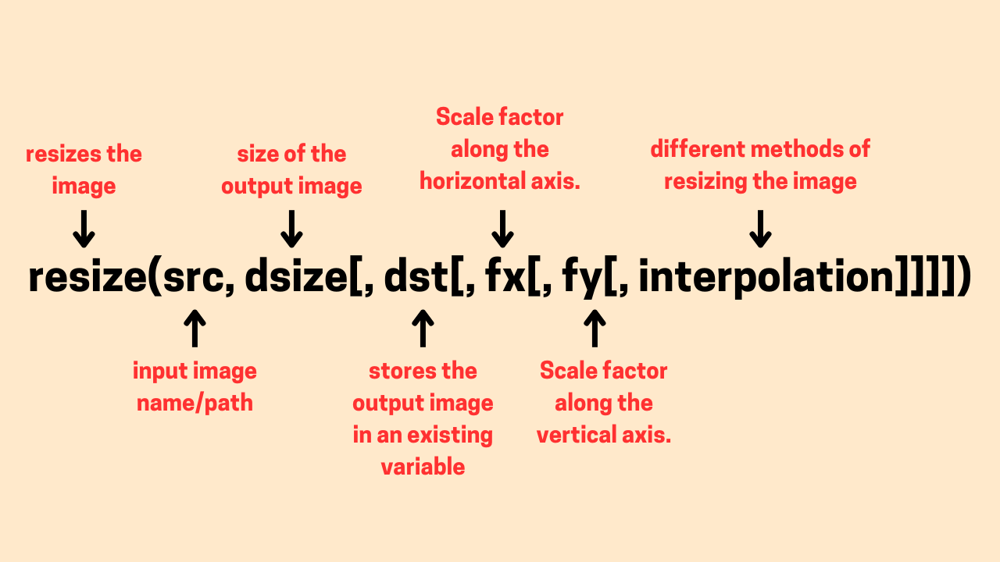](https://opencv.org/wp-content/uploads/2025/03/Resize-an-Image.png)
resized_image = cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=cv2.INTER_LINEAR)


In [13]:
im = Image.open(data_dir / 'cat.jpg')
im_resize = im.resize((300,250))

In [17]:
print(f"the oringinal image size is {im.size}")
print(f"the shrinked image size is {im_resize.size}")
# cv2.resize??

the oringinal image size is (1280, 1073)
the shrinked image size is (300, 250)


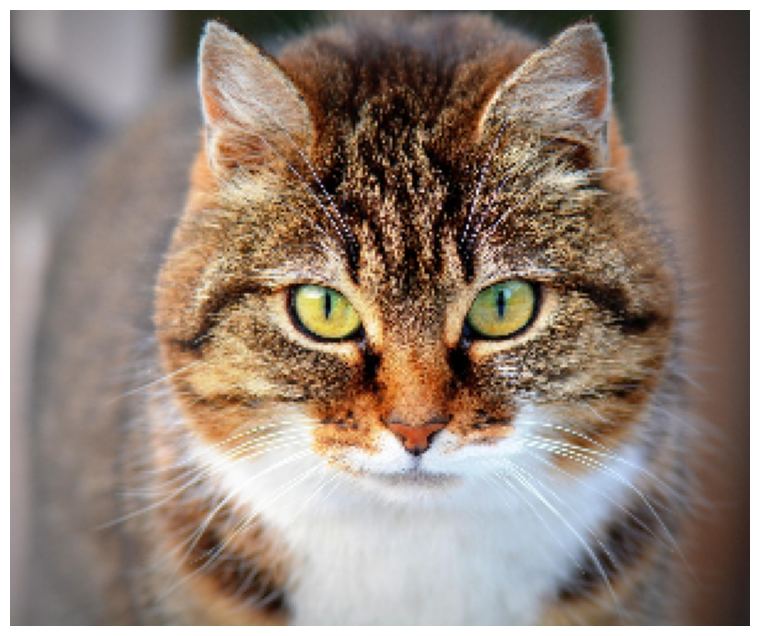

In [32]:
# cv2.resize(im,(1280, 1073))
src=np.array(im)
dsize=(300,250)
resized_image = cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=cv2.INTER_LINEAR)
# resized_image_bgr = cv2.cvtColor(resized_image, cv2.COLOR_RGB2BGR)
pilshow(resized_image)

INPUT shape:(1073, 1280, 3)


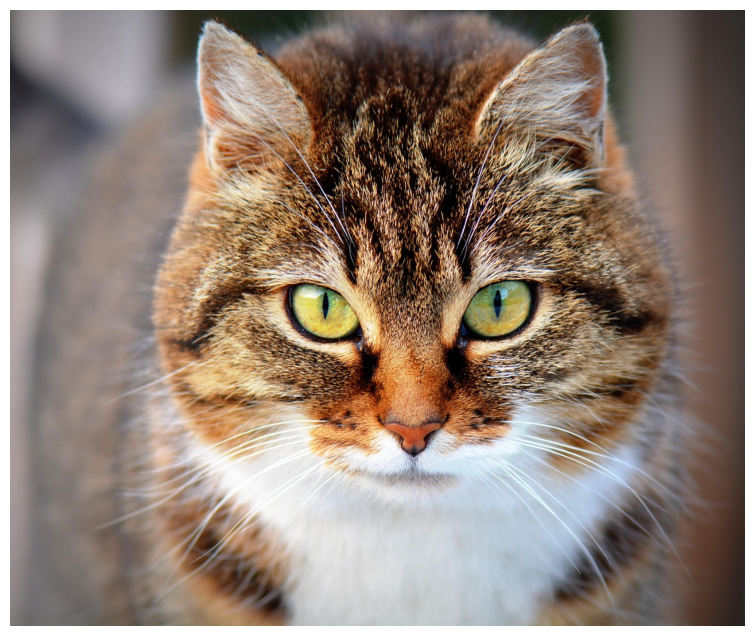

Shrinked shape:(250, 300, 3)


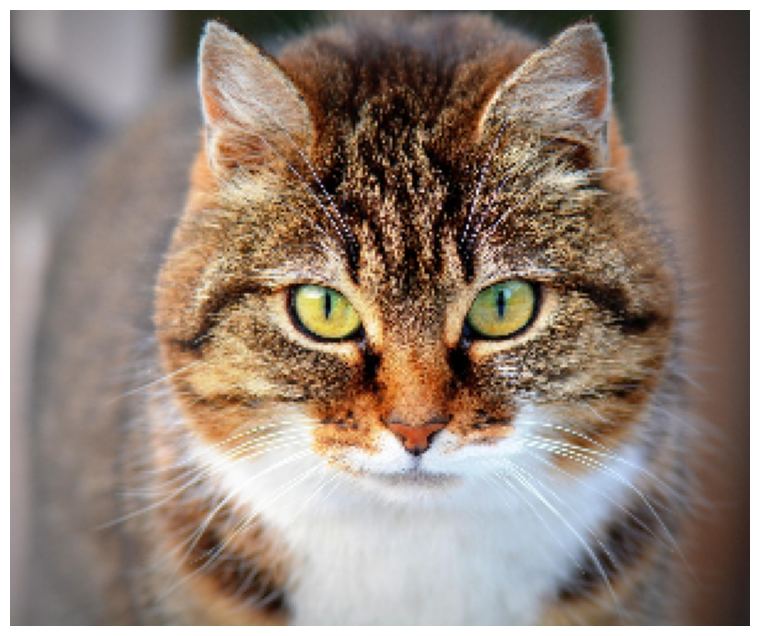

LINEAR INTERPO shape:(1073, 1280, 3)


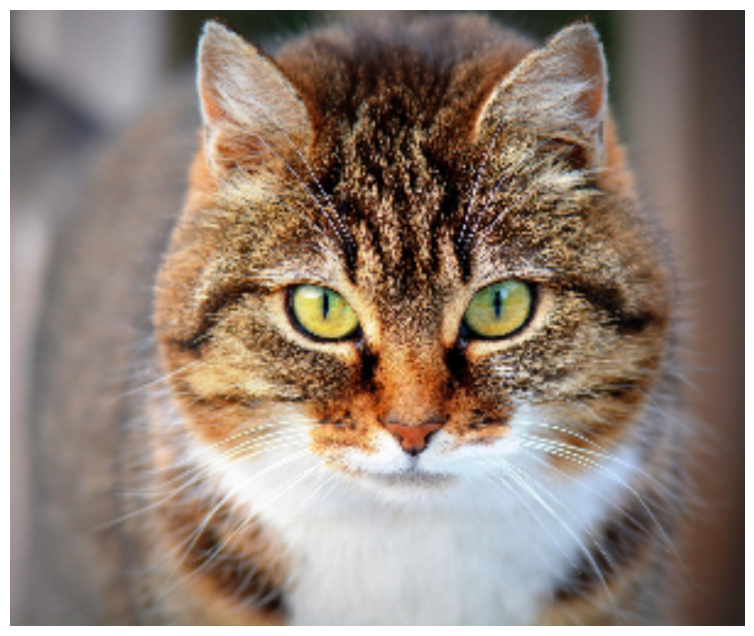

NEAREST INTERPO shape:(1073, 1280, 3)


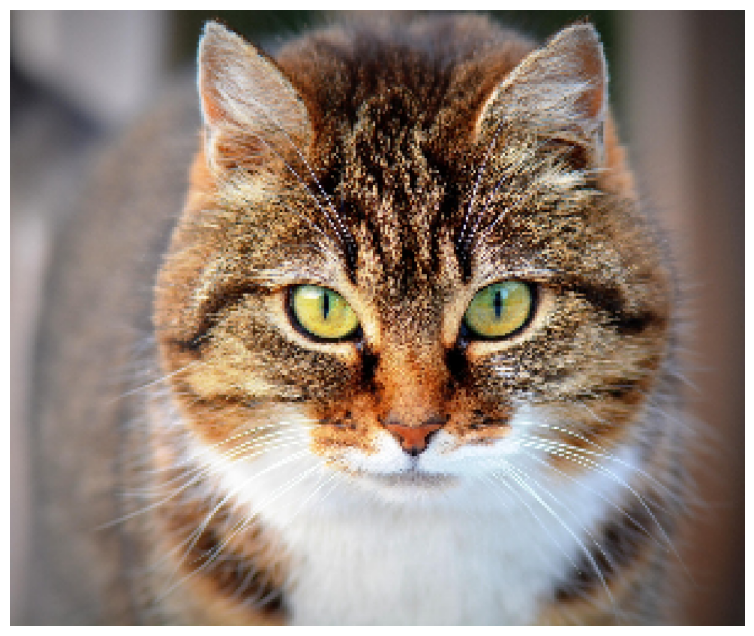

CUBIC INTERPO shape:(1073, 1280, 3)


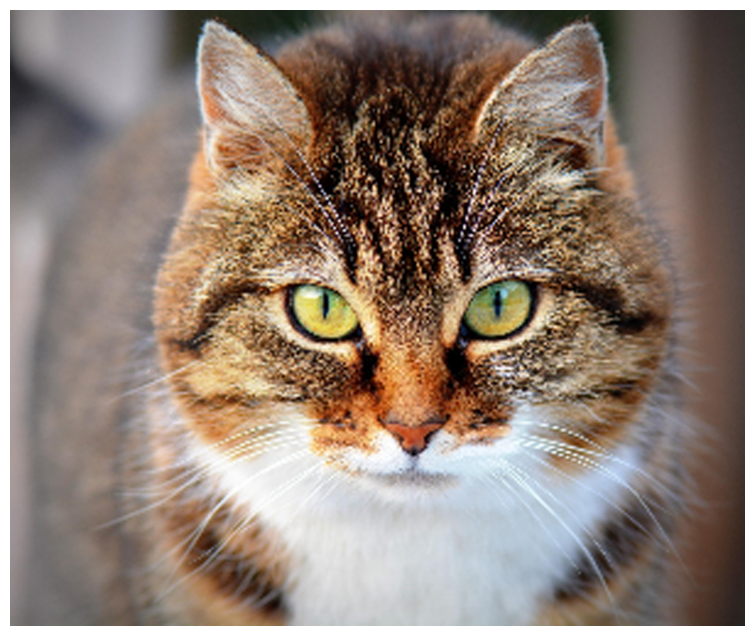

In [54]:
input_image=cv2.imread(data_dir /  'cat.jpg')
input_image_rgb = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
print(f"INPUT shape:{input_image_rgb.shape}")
pilshow(input_image_rgb)

src=input_image
dsize=(300,250)
resized_image = cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=cv2.INTER_LINEAR)
resized_image_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)
print(f"Shrinked shape:{resized_image_rgb.shape}")
pilshow(resized_image_rgb)

# return to the original size
# use INTERPOLATION_LINEAR
src=resized_image
dsize=(1280, 1073)
redo_image_lin = cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=cv2.INTER_LINEAR)
redo_image_lin_rgb = cv2.cvtColor(redo_image_lin, cv2.COLOR_BGR2RGB)
print(f"LINEAR INTERPO shape:{redo_image_lin_rgb.shape}")
pilshow(redo_image_lin_rgb)

# use INTERPOLATION_NEAREST
src=resized_image
dsize=(1280, 1073)
redo_image_nea = cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=cv2.INTER_NEAREST)
redo_image_nea_rgb = cv2.cvtColor(redo_image_nea, cv2.COLOR_BGR2RGB)
print(f"NEAREST INTERPO shape:{redo_image_nea_rgb.shape}")
pilshow(redo_image_nea_rgb)

# use INTERPOLATION_CUBIC
src=resized_image
dsize=(1280, 1073)
redo_image_cub = cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=cv2.INTER_CUBIC)
redo_image_cub_rgb = cv2.cvtColor(redo_image_cub, cv2.COLOR_BGR2RGB)
print(f"CUBIC INTERPO shape:{redo_image_cub_rgb.shape}")
pilshow(redo_image_cub_rgb)

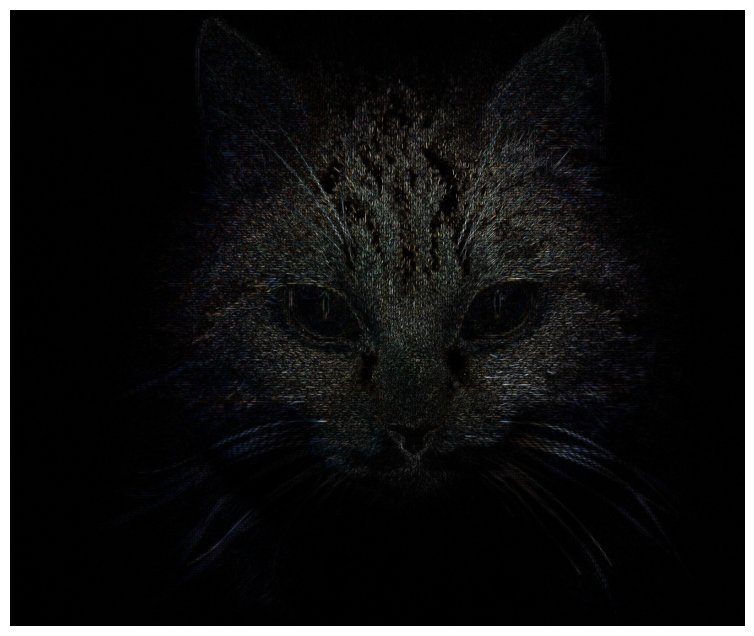

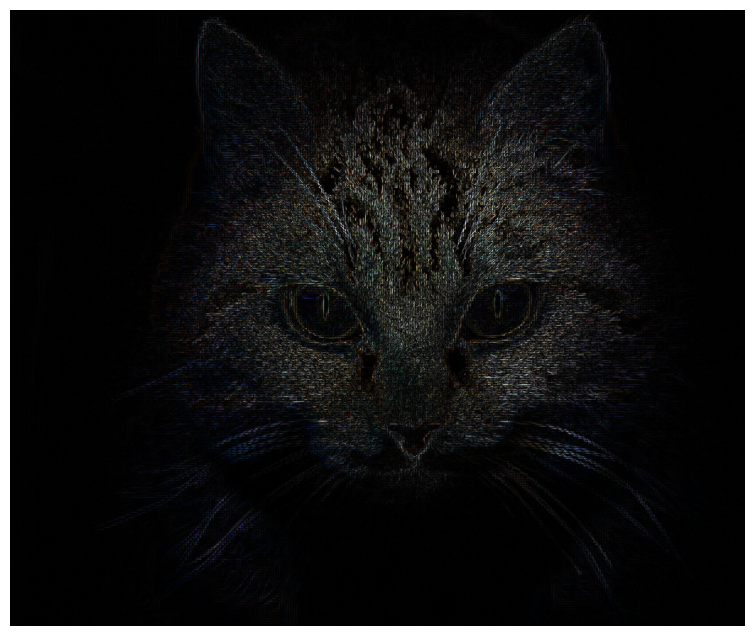

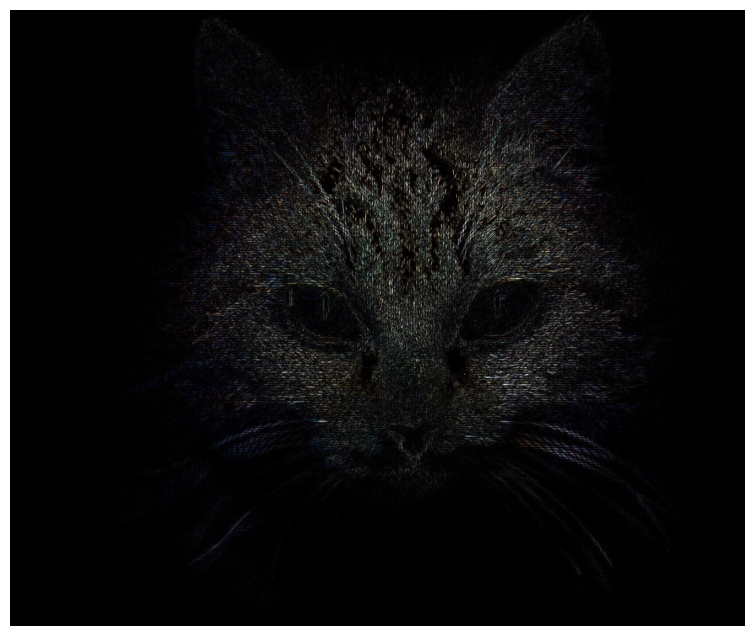

In [55]:
# Calculate difference images (convert to float to handle negative values)
diff_linear_org = cv2.absdiff(redo_image_lin_rgb, input_image_rgb)
diff_nearest_org = cv2.absdiff(redo_image_nea_rgb, input_image_rgb)
diff_cubic_org = cv2.absdiff(redo_image_cub_rgb, input_image_rgb)
pilshow(diff_linear_org)
pilshow(diff_nearest_org)
pilshow(diff_cubic_org)

Look Interpolation method here cannot recover lost details in the original image, but it can help to create a visually 
appealing result when enlarging or transforming images.

## Using Python to implement image filtering with the provided image as input.
cv2.filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]])


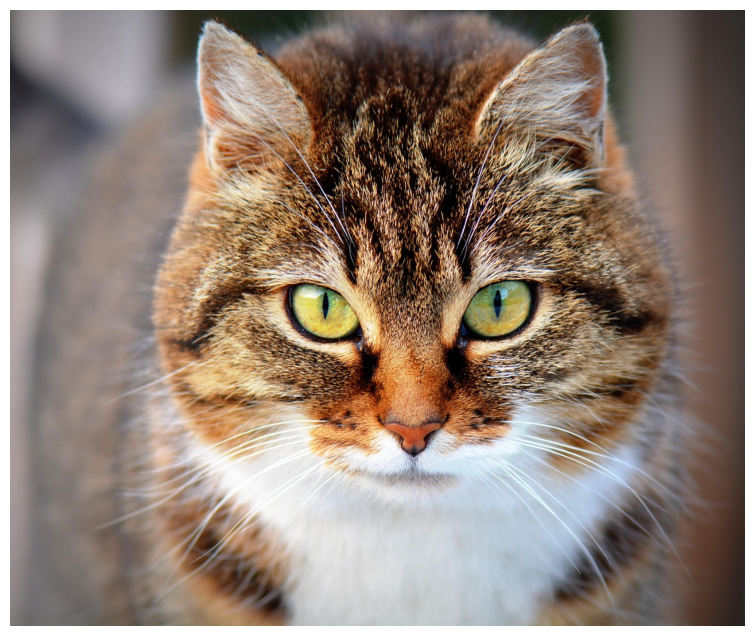

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


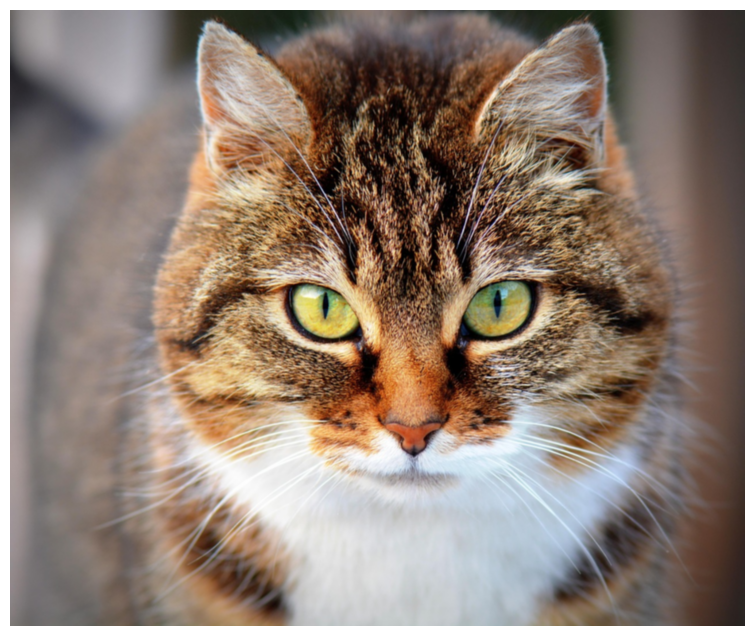

[[-0.11111111 -0.11111111 -0.11111111]
 [-0.11111111  1.8888888  -0.11111111]
 [-0.11111111 -0.11111111 -0.11111111]]


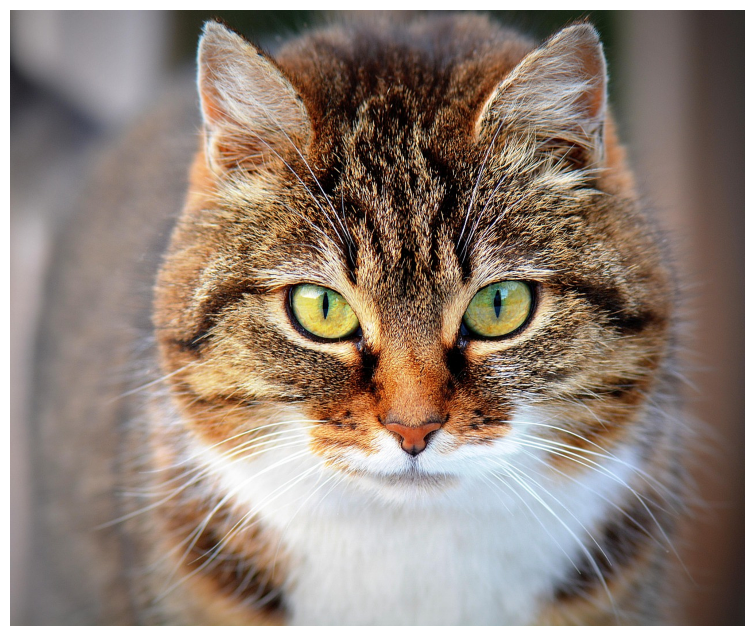

[[0.0625 0.125  0.0625]
 [0.125  0.25   0.125 ]
 [0.0625 0.125  0.0625]]


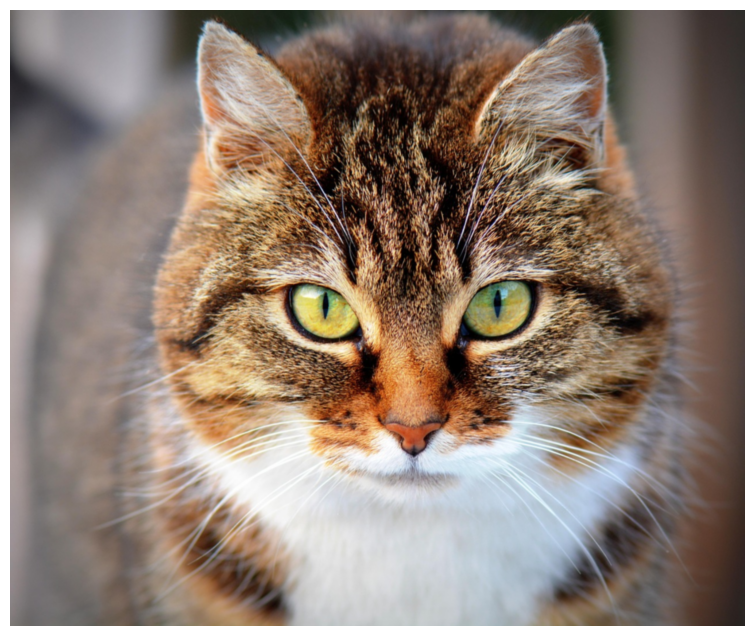

[[0.003663   0.01465201 0.02564103 0.01465201 0.003663  ]
 [0.01465201 0.05860806 0.0952381  0.05860806 0.01465201]
 [0.02564103 0.0952381  0.15018316 0.0952381  0.02564103]
 [0.01465201 0.05860806 0.0952381  0.05860806 0.01465201]
 [0.003663   0.01465201 0.02564103 0.01465201 0.003663  ]]


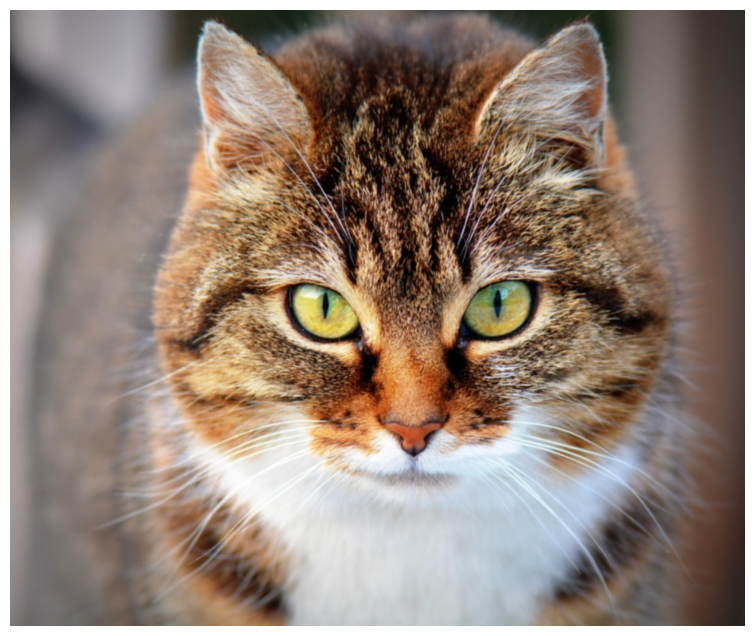

In [25]:
input_image=cv2.imread(data_dir /  'cat.jpg')
input_image_rgb = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
pilshow(input_image_rgb)

# 3X3 mean
src=input_image
kernel_size = 3
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) 

kernel /= (kernel_size * kernel_size) # averave through dividing kenel size^2
print(kernel)
ddepth = -1
        
dst = cv2.filter2D(src, ddepth, kernel)
dst_rgb = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
pilshow(dst_rgb)

# 3X3 enhance
src=input_image
kernel_size = 3
kernel = np.array([[0,0,0],[0,2,0],[0,0,0]], dtype=np.float32) \
      - np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size ** 2)

print(kernel)
ddepth = -1
        
dst = cv2.filter2D(src, ddepth, kernel)
dst_rgb = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
pilshow(dst_rgb)

# 3X3 others
src=input_image
kernel_size = 3
kernel = np.array([[1,2,1],[2,4,2],[1,2,1]], dtype=np.float32) / 16
print(kernel)
ddepth = -1
        
dst = cv2.filter2D(src, ddepth, kernel)
dst_rgb = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
pilshow(dst_rgb)


# 5X5 others
src=input_image
kernel_size = 5
kernel = np.array([[1,4,7,4,1],[4,16,26,16,4],[7,26,41,26,7],[4,16,26,16,4],\
                   [1,4,7,4,1]], dtype=np.float32) / 273
print(kernel)
ddepth = -1
        
dst = cv2.filter2D(src, ddepth, kernel)
dst_rgb = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
pilshow(dst_rgb)

## Image Pyramid
https://docs.opencv.org/4.9.0/dc/dff/tutorial_py_pyramids.html


In [45]:
!python -m wget http://www.bilibili996.com/upload/image/6379728104208952518826236.jpg -o "{data_dir / 'messi5.jpg'}"


Saved under d:\EE5811\data\messi5.jpg


Original:


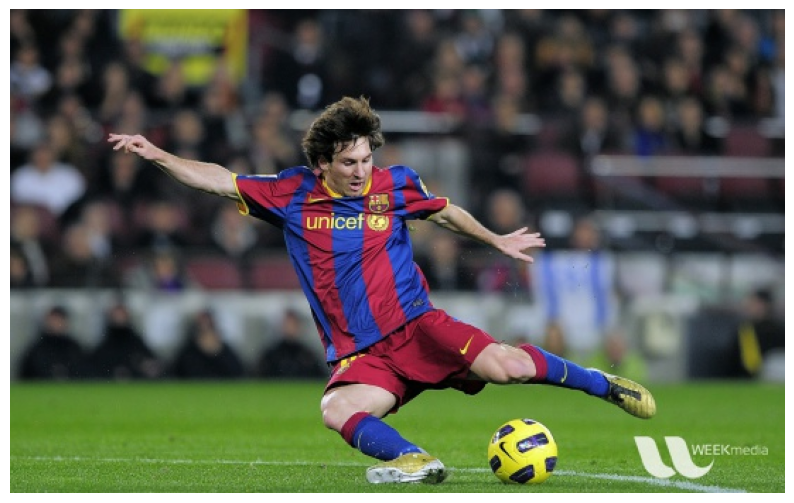

Half Resolution:


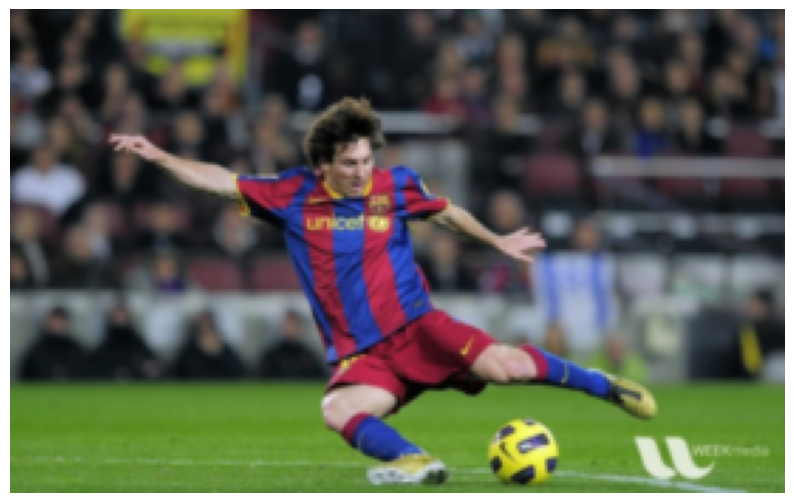

Upgrade Resolution:


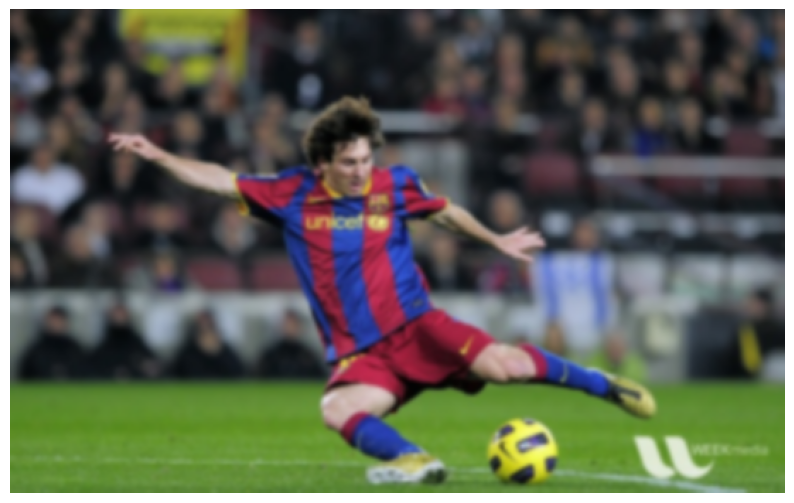

In [56]:
img = cv2.imread(data_dir / 'messi5.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print("Original:")
pilshow(img_rgb)

lower_reso = cv2.pyrDown(img)
lower_reso_rgb = cv2.cvtColor(lower_reso, cv2.COLOR_BGR2RGB)
print("Half Resolution:")
pilshow(lower_reso_rgb)

higher_reso2 = cv2.pyrUp(lower_reso)
higher_reso2_rgb = cv2.cvtColor(higher_reso2, cv2.COLOR_BGR2RGB)
print("Upgrade Resolution:")
pilshow(higher_reso2_rgb)
